In [60]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import os
import re
from tqdm.notebook import tqdm
import plotly.graph_objects as go

import plotly.io as pio

# Set the renderer to 'browser' or 'notebook'
pio.renderers.default = 'notebook'  # or 'notebook' if you're in a Jupyter notebook


In [61]:
with h5py.File("/media/dan/Data/outputs/ubiquitous-spork/pyspi_combined_patient_hdf5s/001_20250414.h5", 'r') as f:
    print(f['metadata/adjacency_matrices'].keys())

<KeysViewHDF5 ['bary-sq_euclidean_max', 'bary-sq_euclidean_mean', 'bary_euclidean_max', 'bary_euclidean_mean', 'ce_gaussian', 'cohmag_multitaper_mean_fs-1_fmin-0-000488_fmax-0-00195', 'cohmag_multitaper_mean_fs-1_fmin-0-000488_fmax-0-0342', 'cohmag_multitaper_mean_fs-1_fmin-0-000488_fmax-0-122', 'cohmag_multitaper_mean_fs-1_fmin-0-00195_fmax-0-00391', 'cohmag_multitaper_mean_fs-1_fmin-0-00391_fmax-0-00586', 'cohmag_multitaper_mean_fs-1_fmin-0-00586_fmax-0-0146', 'cohmag_multitaper_mean_fs-1_fmin-0-0146_fmax-0-0342', 'cohmag_multitaper_mean_fs-1_fmin-0-0342_fmax-0-0732', 'cohmag_multitaper_mean_fs-1_fmin-0-0342_fmax-0-122', 'cohmag_multitaper_mean_fs-1_fmin-0-0732_fmax-0-122', 'cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-5', 'cov-sq_EmpiricalCovariance', 'cov-sq_GraphicalLasso', 'cov-sq_GraphicalLassoCV', 'cov-sq_LedoitWolf', 'cov-sq_MinCovDet', 'cov-sq_OAS', 'cov-sq_ShrunkCovariance', 'cov_EmpiricalCovariance', 'cov_GraphicalLassoCV', 'cov_LedoitWolf', 'cov_MinCovDet', 'cov_OAS', 'cov_Sh

In [62]:
# hypothesis
# pdist_cosine is proxy for "anatomical" processing distance 
# 35, 1, 10, 109

In [63]:
path = '/media/dan/Data/outputs/ubiquitous-spork/pyspi_combined_patient_hdf5s/'
list(sorted([x.split('_')[0] for x in os.listdir(path) if 'h5' in x]));

In [64]:
pid = '035'

with h5py.File(f"/media/dan/Data/outputs/ubiquitous-spork/pyspi_combined_patient_hdf5s/{pid}_20250414.h5", 'r') as f:
    data = f['metadata/adjacency_matrices']['pdist_cosine'][()]
    soz = f['metadata/patient_info/soz'][()]
    ilae = f['metadata/patient_info/ilae'][()]
    names = f['metadata/patient_info/electrode_data/electrode'][()]
    x_values = f['metadata/patient_info/electrode_data/x'][()]
    y_values = f['metadata/patient_info/electrode_data/y'][()]
    z_values = f['metadata/patient_info/electrode_data/z'][()]
    # byte to string
    names = [name.decode('utf-8') for name in names]
xyz = np.array([x_values,y_values,z_values])


# remove numbers from names

electrode_names = np.array([re.sub(r'\d+', '', name) for name in names])

curr = 'empty'
name_mask = np.zeros(len(electrode_names))
for i, name in enumerate(electrode_names):
    if name == curr:
        name_mask[i] = 0
    else:
        curr = name
        name_mask[i] = 1

name_mask = name_mask.astype(float)
print(ilae)

1


In [65]:
d = data.copy()
# row_flattened = d.reshape(-1, d.shape[-1])

# # normalize along columns
# row_flattened = (row_flattened - np.nanmean(row_flattened, axis=0, keepdims=True)) / np.nanstd(row_flattened, axis=0, keepdims=True)
# d = row_flattened.reshape(d.shape)

avg = np.nanmedian(d,axis=-1)

/home/dan/anaconda3/envs/networks/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning:

All-NaN slice encountered



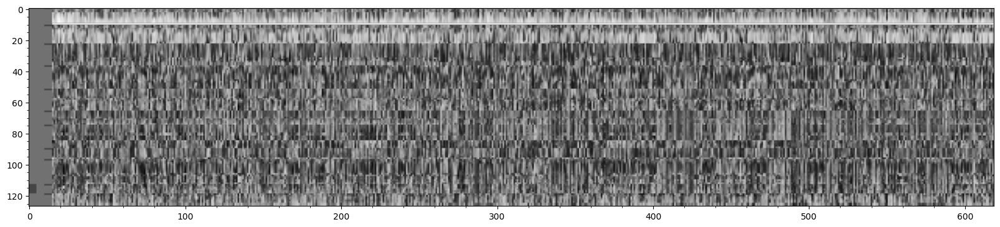

In [66]:
d = data.copy()

row_flattened = d.reshape(-1, d.shape[-1])

# normalize along columns
row_flattened = (row_flattened - np.nanmean(row_flattened, axis=0, keepdims=True)) / np.nanstd(row_flattened, axis=0, keepdims=True)


max_v = np.nanmax(row_flattened)
min_v = np.nanmin(row_flattened)
m = np.max([np.abs(max_v), np.abs(min_v)])

n = data.shape[0]

col_mask = np.repeat(soz, n).reshape(-1, 1)
row_mask = np.tile(soz, n).reshape(-1, 1)
name = np.tile(name_mask, n).reshape(-1, 1)


q = 5
row = np.tile(row_mask, q)
col = np.tile(col_mask, q)
name = np.tile(name, q)

mask = np.concatenate([row, col], axis=1)

# Convert mask to float type to handle the max_v and min_v values
mask = mask.astype(float)

# # fill mask with max where 1 and min where 0
# mask[mask == 1] = 1
# mask[mask == 0] = 0

mask = np.concatenate([mask, name], axis=1)

out = np.concatenate([mask, row_flattened], axis=1)

# drange = np.nanmax(np.abs(max_v), np.abs(min_v))


i=np.arange(0,col.shape[0],n)[10]
plt.figure(figsize=(20,10))
plt.imshow(out[i:(i+n), :], cmap='gray_r')
# plt.colorbar()

# plt.imshow(out[i:(i+n), :], cmap='gray', vmin=0, vmax=.25)
plt.minorticks_on()


In [67]:
# Get the top or bottom K indexs

def getK(arr, k, top=True):
    """
    Get the indices of the k largest or smallest values in the array
    
    Args:
        arr: Input array
        k: Number of values to return
        top: If True, return largest values. If False, return smallest values
    
    Returns:
        Indices of k largest/smallest values
    """
    if top:
        return np.argsort(arr)[-k:][::-1]  # Get indices of k largest values
    else:
        return np.argsort(arr)[:k]  # Get indices of k smallest values

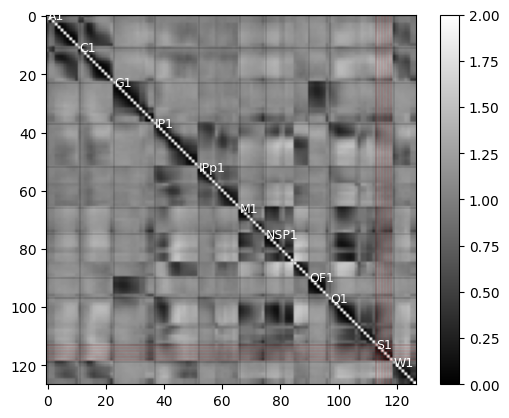

In [68]:
plt.imshow(avg, cmap='gray',vmin=0,vmax=2)
plt.colorbar()
for i,w in enumerate(name_mask):
    if w == 1:
        plt.axvline(i,color='k', alpha=0.8, linewidth=0.2)
        plt.axhline(i,color='k', alpha=0.8, linewidth=0.2)
    if soz[i] == 1:
        plt.axvline(i,color='r',alpha=0.5, linewidth=0.2)
        plt.axhline(i,color='r',alpha=0.5, linewidth=0.2)

# label ticks where name_mask is 1
for i,w in enumerate(name_mask):
    if w == 1:
        plt.text(i, i, names[i], color='w', fontsize=9, ha='left', va='center')


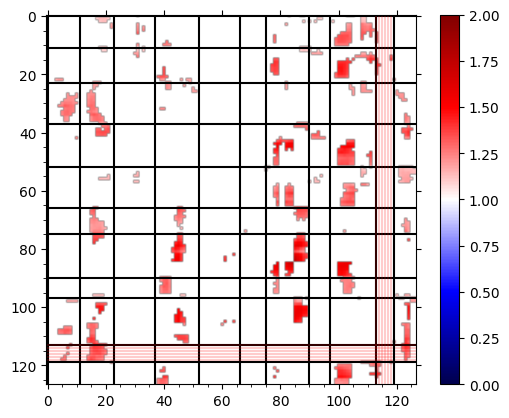

In [69]:
idxs = []
for x in range(data.shape[0]):
    idxs.append(getK(avg[x,:],10,top=True))

# make new adjacency matrix with only the top 10 values, start with nan matrix
new_data = np.full_like(avg, np.nan)
for i, idx in enumerate(idxs):
    new_data[i, idx] = avg[i, idx]

min_value = np.nanmin(new_data)
max_value = np.nanmax(new_data)
maxv = np.max([np.abs(min_value), np.abs(max_value)])

plt.imshow(new_data, cmap='seismic',vmin=0,vmax=2)
plt.colorbar()
# place ticks and numbers on top and right of plot as well as left and bottom
plt.tick_params(top=True, right=True, left=True, bottom=True)
plt.minorticks_on()

for i,w in enumerate(name_mask):
    if w == 1:
        plt.axvline(i,color='k')
        plt.axhline(i,color='k')
    if soz[i] == 1:
        plt.axvline(i,color='r',alpha=0.2)
        plt.axhline(i,color='r',alpha=0.2)

In [70]:
xyz.shape

(3, 127)

In [71]:
def create_distance_matrix(xyz):
    """
    Calculate pairwise Euclidean distances between 3D points and return as adjacency matrix.
    
    Parameters:
    xyz: numpy array of shape (n, 3) where n is the number of points
         Each row contains [x, y, z] coordinates
    
    Returns:
    distances: numpy array of shape (n, n) containing pairwise distances
    """
    # Reshape to (n, 1, 3) and (1, n, 3) for broadcasting
    diff = xyz[:, np.newaxis, :] - xyz[np.newaxis, :, :]
    
    # Calculate Euclidean distances using broadcasting
    # This computes sqrt(sum((x_i - x_j)^2 + (y_i - y_j)^2 + (z_i - z_j)^2))
    distances = np.sqrt(np.sum(diff**2, axis=2))
    
    return distances


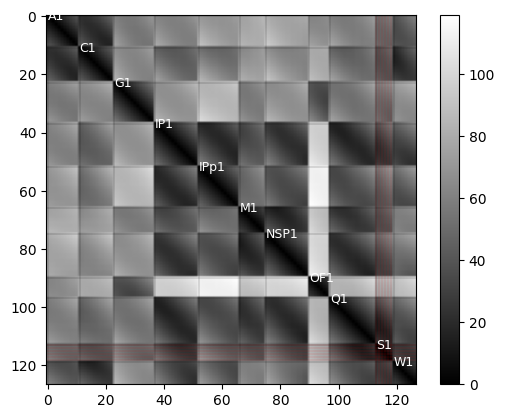

In [72]:

dist_matrix = create_distance_matrix(xyz.T)
plt.imshow(dist_matrix, cmap='gray')

plt.colorbar()
for i,w in enumerate(name_mask):
    if w == 1:
        plt.axvline(i,color='k', alpha=0.8, linewidth=0.2)
        plt.axhline(i,color='k', alpha=0.8, linewidth=0.2)
    if soz[i] == 1:
        plt.axvline(i,color='r',alpha=0.5, linewidth=0.2)
        plt.axhline(i,color='r',alpha=0.5, linewidth=0.2)

# label ticks where name_mask is 1
for i,w in enumerate(name_mask):
    if w == 1:
        plt.text(i, i, names[i], color='w', fontsize=9, ha='left', va='center')





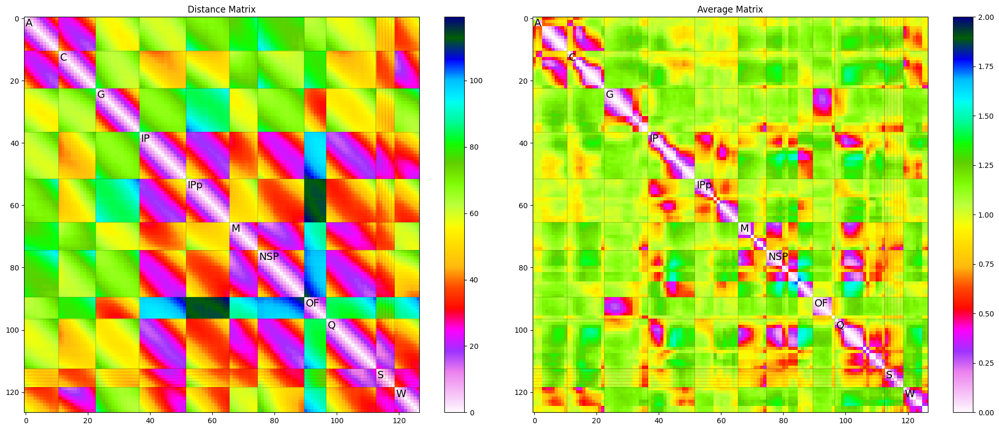

In [73]:
# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# First subplot - Distance Matrix
im1 = ax1.imshow(dist_matrix, cmap='gist_ncar_r')
plt.colorbar(im1, ax=ax1)
ax1.set_title('Distance Matrix')

# Add lines and labels for first subplot
for i, w in enumerate(name_mask):
    if w == 1:
        ax1.axvline(i-0.5, color='k', alpha=0.8, linewidth=0.2)
        ax1.axhline(i-0.5, color='k', alpha=0.8, linewidth=0.2)
    if soz[i] == 1:
        ax1.axvline(i-0.5, color='r', alpha=0.8, linewidth=0.2)
        ax1.axhline(i-0.5, color='r', alpha=0.8, linewidth=0.2)

# Add labels for first subplot
for i, w in enumerate(name_mask):
    if w == 1:
        ax1.text(i, i, ''.join(c for c in names[i] if not c.isdigit()), color='k', fontsize=14, ha='left', va='top')

# Second subplot - Average Matrix
im2 = ax2.imshow(avg, cmap='gist_ncar_r', vmin=0, vmax=2)
plt.colorbar(im2, ax=ax2)
ax2.set_title('Average Matrix')

# Add lines and labels for second subplot
for i, w in enumerate(name_mask):
    if w == 1:
        ax2.axvline(i-0.5, color='k', alpha=0.8, linewidth=0.2)
        ax2.axhline(i-0.5, color='k', alpha=0.8, linewidth=0.2)
    if soz[i] == 1:
        ax2.axvline(i-0.5, color='r', alpha=0.8, linewidth=0.2)
        ax2.axhline(i-0.5, color='r', alpha=0.8, linewidth=0.2)

# Add labels for second subplot
for i, w in enumerate(name_mask):
    if w == 1:
        ax2.text(i, i, ''.join(c for c in names[i] if not c.isdigit()), color='k', fontsize=14, ha='left', va='top')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [74]:
electrode_indices = np.arange(len(names))  # Example indices

x = x_values
y = y_values
z = z_values

# Calculate center points for the planes
x_center = 0  # x=0 plane
y_center = (max(y) + min(y)) / 2
z_center = (max(z) + min(z)) / 2

y_plane_center = min(y)-10  # y plane position
x_plane_center = (max(x) + min(x)) / 2

# Create the figure
fig = go.Figure(data=[
    # Original scatter plot
    go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers+text',
        text=[f"{name}" for name in names],
        textposition="middle center",
        textfont=dict(size=8,color="white"),
        hoverinfo='none',
        marker=dict(
            size=9,
            color=soz,
            colorscale=[[0, 'black'], [1, 'red']],
            opacity=1
        )
    ),
    # Add plane at x = 0
    go.Surface(
        x=[[0, 0], [0, 0]],  # x = 0 plane
        y=[[min(y), max(y)], [min(y), max(y)]],
        z=[[min(z), min(z)], [max(z), max(z)]],
        opacity=0.3,
        showscale=False,
        colorscale=[[0, 'lightblue'], [1, 'lightblue']],
        hoverinfo='none'
    ),
    # Add plane at xz
    go.Surface(
        x=[[min(x), max(x)], [min(x), max(x)]],
        y=[[y_plane_center, y_plane_center], [y_plane_center, y_plane_center]],
        z=[[min(z), min(z)], [max(z), max(z)]],
        opacity=0.3,
        showscale=False,
        colorscale=[[0, 'lightblue'], [1, 'lightblue']],
        hoverinfo='none'
    )
])

# Update the layout with annotations
fig.update_layout(
    title='3D Electrode Positions with Anatomical Labels',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        annotations=[
            # Medial label for x=0 plane
            dict(
                x=x_center,
                y=y_center,
                z=z_center,
                text="Medial",
                showarrow=False,
                font=dict(size=10, color='black'),
                xanchor='center',
                yanchor='middle'
            ),
            # Posterior label for y plane
            dict(
                x=x_plane_center,
                y=y_plane_center,
                z=z_center,
                text="Posterior",
                showarrow=False,
                font=dict(size=10, color='black'),
                xanchor='center',
                yanchor='middle'
            )
        ]
    ),
    width=1000,
    height=800,
    margin=dict(l=0, r=0, b=0, t=30)
)

# Show the plot
fig.show()

In [108]:
# Get the top or bottom K indexs
def getK(arr, electrode_array, k, top=True, seperation=None):
    """
    Get the indices of the k largest or smallest values in the array
    
    Args:
        arr: Input array
        k: Number of values to return
        top: If True, return largest values. If False, return smallest values
    
    Returns:
        Indices of k largest/smallest values
    """
    cpy = arr.copy()
    other_e = []

    # find idx where nan
    nan_idx = np.where(np.isnan(arr))[0]
    my_e = electrode_array[nan_idx]
    if seperation == 'outside_electrode':
        other_e = np.where(electrode_names == my_e)[0]
    elif seperation == 'within_electrode':
        other_e = np.where(electrode_names != my_e)[0]

    if top:
        cpy[other_e] = -np.inf
    else:
        cpy[other_e] = np.inf

    if top:
        return np.argsort(cpy)[-k:][::-1]  # Get indices of k largest values
    else:
        return np.argsort(cpy)[:k]  # Get indices of k smallest values

idxs = []
for x in range(data.shape[0]):
    idxs.append(getK(avg[x,:],electrode_names,8,top=False, seperation='outside_electrode'))

# make new adjacency matrix with only the top 10 values, start with nan matrix
new_adjacency = np.full_like(avg, np.nan)
for i, idx in enumerate(idxs):
    new_adjacency[i, idx] = avg[i, idx]

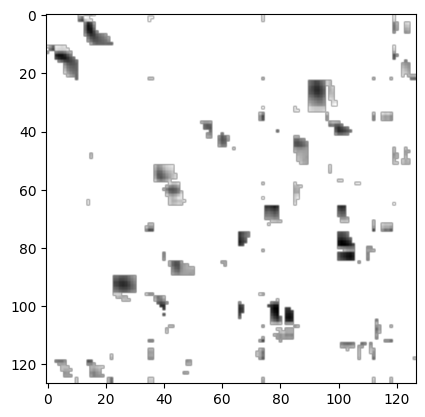

In [109]:
plt.imshow(new_adjacency, cmap='gray')

In [110]:
def plot_electrode_network(x_values, y_values, z_values, names, soz, new_adjacency):
    """
    Plot 3D electrode positions with connecting lines where adjacency matrix is non-NaN
    
    Parameters:
    -----------
    x_values, y_values, z_values : array-like
        Coordinates of electrodes
    names : list
        Names of electrodes
    soz : array-like
        Binary array indicating SOZ electrodes
    new_adjacency : np.ndarray
        Adjacency matrix where non-NaN values indicate connections
    """

    
    # Calculate center points for the planes
    x_center = 0
    y_center = (max(y_values) + min(y_values)) / 2
    z_center = (max(z_values) + min(z_values)) / 2
    y_plane_center = min(y_values)-10
    x_plane_center = (max(x_values) + min(x_values)) / 2
    
    # Create line traces for connections
    line_traces = []
    n = len(new_adjacency)
    for i in range(n):
        for j in range(n):  
            if not np.isnan(new_adjacency[i,j]):

                # Calculate direction vector
                dx = x_values[j] - x_values[i]
                dy = y_values[j] - y_values[i]
                dz = z_values[j] - z_values[i]
                
                # Normalize the direction vector
                magnitude = np.sqrt(dx**2 + dy**2 + dz**2)
                dx_norm = dx / magnitude
                dy_norm = dy / magnitude
                dz_norm = dz / magnitude
                
                # Create a line between electrodes i and j with arrow
                line_traces.append(
                    go.Cone(
                        x=[x_values[j]],  # Arrow head at destination
                        y=[y_values[j]], 
                        z=[z_values[j]],
                        u=[dx_norm],  # Normalized direction vector
                        v=[dy_norm],
                        w=[dz_norm],
                        sizeref=4,  # Scale the arrow size
                        colorscale=[[0, 'gray'], [1, 'gray']],
                        showscale=False,
                        opacity=0.9,
                    )
                )


                # # Create a line between electrodes i and j with arrow
                # scales based on distance
                # line_traces.append(
                #     go.Cone(
                #         x=[x_values[j]],  # Arrow head at destination
                #         y=[y_values[j]], 
                #         z=[z_values[j]],
                #         u=[x_values[j] - x_values[i]],  # Direction vector
                #         v=[y_values[j] - y_values[i]],
                #         w=[z_values[j] - z_values[i]],
                #         sizeref=0.1,  # Scale the arrow size
                #         colorscale=[[0, 'gray'], [1, 'gray']],
                #         showscale=False,
                #         opacity=0.9,
                #     )
                # )
                # Add the line segment
                line_traces.append(
                    go.Scatter3d(
                        x=[x_values[i], x_values[j]],
                        y=[y_values[i], y_values[j]],
                        z=[z_values[i], z_values[j]],
                        line=dict(
                            color='gray',
                            width=2,
                        ),
                        opacity=0.5,
                        hoverinfo='none',
                        showlegend=False,
                    )
                )
    
    # Create the figure with all traces
    fig = go.Figure(data=[
        # Anatomical planes
        go.Surface(
            x=[[0, 0], [0, 0]],  # x = 0 plane
            y=[[min(y_values), max(y_values)], [min(y_values), max(y_values)]],
            z=[[min(z_values), min(z_values)], [max(z_values), max(z_values)]],
            opacity=0.3,
            showscale=False,
            colorscale=[[0, 'lightblue'], [1, 'lightblue']],
            hoverinfo='none',
            showlegend=False,
        ),
        go.Surface(
            x=[[min(x_values), max(x_values)], [min(x_values), max(x_values)]],
            y=[[y_plane_center, y_plane_center], [y_plane_center, y_plane_center]],
            z=[[min(z_values), min(z_values)], [max(z_values), max(z_values)]],
            opacity=0.3,
            showscale=False,
            colorscale=[[0, 'lightblue'], [1, 'lightblue']],
            hoverinfo='none',
            showlegend=False,
        ),

        
        # Electrode points
        go.Scatter3d(
            x=x_values,
            y=y_values,
            z=z_values,
            mode='markers+text',
            text=[f"{name}" for name in names],
            textposition="middle center",
            textfont=dict(size=8,color="white"),
            hoverinfo='none',
            marker=dict(
                size=9,
                color=soz,
                colorscale=[[0, 'black'], [1, 'red']],
                opacity=1
            ),
            showlegend=False,
        ),

        # Lines
        *line_traces,
    ])

    # Update the layout
    fig.update_layout(
        title='3D Electrode Network with Anatomical Labels',
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            annotations=[
                dict(
                    x=x_center,
                    y=y_center,
                    z=z_center,
                    text="Medial",
                    showarrow=False,
                    font=dict(size=10, color='black'),
                    xanchor='center',
                    yanchor='middle'
                ),
                dict(
                    x=x_plane_center,
                    y=y_plane_center,
                    z=z_center,
                    text="Posterior",
                    showarrow=False,
                    font=dict(size=10, color='black'),
                    xanchor='center',
                    yanchor='middle'
                )
            ],
        ),
        width=1000,
        height=800,
        margin=dict(l=0, r=0, b=0, t=30)
    )
    
    return fig

# Example usage:
fig = plot_electrode_network(x_values, y_values, z_values, names, soz, new_adjacency)
fig.show()